# Image Manipulation and Point Operations in Python
In this lab, we will explore fundamental techniques for image manipulation and point operations using Python.
The objectives of this lab include:

- Creating and visualizing image matrices.
- Reading, displaying, and processing images using libraries such as OpenCV and Matplotlib.
- Performing histogram-based operations, such as equalization and quantization, to enhance image contrast.
- Analyzing the effects of these operations on image quality and entropy.

---

### Understanding the Libraries Used
Before starting the lab, provide a brief definition of the following libraries and their role in image processing:

- **OpenCV**: OpenCV is a computer vision library used for reading, processing, and analyzing images and videos.
In this lab, it is used for image loading, color conversion, and basic image processing operations.

- **NumPy**: NumPy is a numerical computing library that provides efficient multi-dimensional array operations.
It is used to represent images as matrices and perform mathematical manipulations on pixel values.

- **Matplotlib**: Matplotlib is a visualization library used to display images, plots, and histograms.

If not installed, you can install them using `pip install opencv-python numpy matplotlib`.

In [1]:
# Import necessary libraries
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Manipulation 1: Matrix Creation and Visualization
In this section, we will:
1. Create specific matrices using vectors A, B, and C.
2. Convert the matrices to `uint8` format.
3. Visualize the matrices using OpenCV and Matplotlib.

### Task 1: Matrix Creation
- **Matrix I1**: 64 rows identical to vector A.  
- **Matrix I2**: A 4x4 block of '1' surrounded by rows of 0 (based on vectors B and C).  
- **Matrix I3**: A 2x2 tiling of matrix I2.  



In [2]:
# Write the code to create vectors and matrices as described above
# Vector A: a 1×64 ramp (0,1,2,...,63)
A = np.arange(64, dtype=np.uint8)

# Vector B: a 1×64 vector with a 4-wide block of 1s in the middle
B = np.zeros(64, dtype=np.uint8)
start = 30  # position of the 4×4 block (center-ish)
B[start:start+4] = 1

# Vector C: a 1×64 vector of zeros
C = np.zeros(64, dtype=np.uint8)

# Matrix I1: 64 identical rows equal to A  -> shape (64, 64)
I1 = np.tile(A, (64, 1))

# Matrix I2: a 4×4 block of 1s surrounded by 0s  -> shape (64, 64)
# Build it by stacking rows: 30 rows of C, 4 rows of B, 30 rows of C
I2 = np.vstack([
    np.tile(C, (30, 1)),
    np.tile(B, (4, 1)),
    np.tile(C, (30, 1)),
]).astype(np.uint8)

# Matrix I3: 2×2 tiling of I2 -> shape (128, 128)
I3 = np.tile(I2, (2, 2))  # repeat I2 twice in both dimensions (vertically and horizontally)

print("A shape:", A.shape, "dtype:", A.dtype)
print("B shape:", B.shape, "dtype:", B.dtype)
print("C shape:", C.shape, "dtype:", C.dtype)
print("I1 shape:", I1.shape, "dtype:", I1.dtype)
print("I2 shape:", I2.shape, "dtype:", I2.dtype)
print("I3 shape:", I3.shape, "dtype:", I3.dtype)


A shape: (64,) dtype: uint8
B shape: (64,) dtype: uint8
C shape: (64,) dtype: uint8
I1 shape: (64, 64) dtype: uint8
I2 shape: (64, 64) dtype: uint8
I3 shape: (128, 128) dtype: uint8


### Task 2: Convert Matrices to uint8 and Visualize
- Convert matrices to `uint8` format using `np.uint8()`.  
- Visualize the matrices using both OpenCV and Matplotlib.  
- OpenCV displays images in a new window, while Matplotlib embeds them in the notebook.  

---

### Notes:
- `cv.imshow` opens images in a new window, which might not work in Google Colab.  
- Use Matplotlib (`plt.imshow`) in Colab to visualize images directly in the notebook.  
- `uint8` conversion ensures values stay within the valid image range (0-255).  


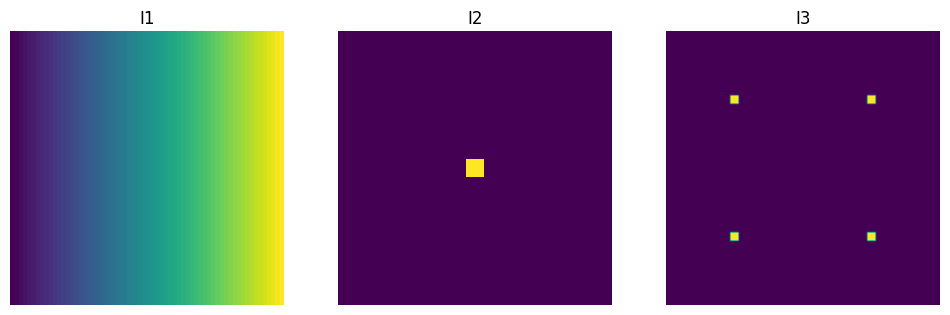

In [3]:
# Write the code to convert matrices to uint8 and visualize them using OpenCV or Matplotlib
import matplotlib.pyplot as plt

I1_u8 = np.uint8(I1)
I2_u8 = np.uint8(I2 * 255)  # scale 0/1 to 0/255 so the block is visible
I3_u8 = np.uint8(I3 * 255)

plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(I1_u8,); plt.title("I1"); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(I2_u8,); plt.title("I2"); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(I3_u8,); plt.title("I3"); plt.axis('off')
plt.show()

## Manipulation 2: Image Reading and RGB Channel Operations
In this section, we will:
1. Read and visualize the image `mandrill.png`.
2. Display image properties (size, depth).
3. Separate RGB channels and visualize them independently.
4. Perform RGB channel swapping and save channels in different formats.
5. Convert the image to grayscale using two methods and compare the results.


### Task 1: Read and Display Image
- Use `cv.imread` to load the image.
- Note: OpenCV loads images in BGR format, so convert to RGB using `cv.cvtColor`.
- Visualize the image using Matplotlib.


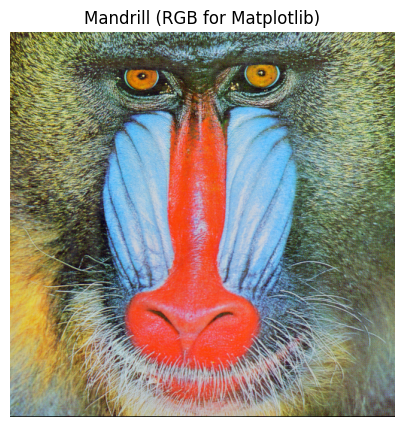

In [4]:
# Write the code to read, convert, and display the image as described above
import cv2 as cv
import matplotlib.pyplot as plt

img_bgr = cv.imread('./images/mandrill.png')
if img_bgr is None:
    raise FileNotFoundError("Could not find ./images/mandrill.png")

img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

plt.figure(figsize=(5,5))
plt.imshow(img_rgb)
plt.title("Mandrill (RGB for Matplotlib)")
plt.axis('off')
plt.show()

### Task 2: Display Image Properties
- Display the image dimensions and data type.
- This provides insight into the image size, channels, and pixel depth.


In [5]:
# Write the code to display the image properties such as shape and data type
print("Shape (H,W,C):", img_bgr.shape)
print("dtype:", img_bgr.dtype)
print("min/max:", img_bgr.min(), img_bgr.max())

Shape (H,W,C): (512, 512, 3)
dtype: uint8
min/max: 0 255


### Task 3: Separate and Visualize RGB Channels
- Split the image into R, G, and B channels using `cv.split()`.
- Visualize each channel separately.

`B, G, R = cv.split(your_BGR_image)`

or 

`R, G, B = cv.split(your_RGB_image)`

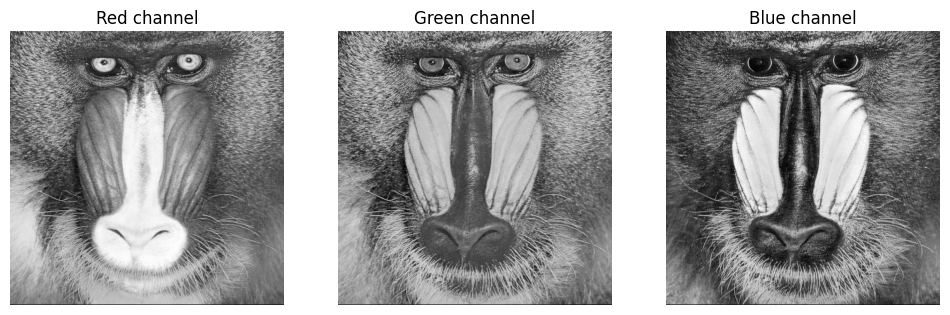

In [7]:
R, G, B = cv.split(img_rgb)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, ch, name in zip(axes, [R, G, B], ["Red channel", "Green channel", "Blue channel"]):
    ax.imshow(ch, cmap="gray", vmin=0, vmax=255)
    ax.set_title(name)
    ax.axis("off")
plt.show()


### Task 4: RGB Channel Swapping
- Swap the RGB channels to visualize different combinations.
- Perform all combinations (RGB, RBG, GRB, GBR, BRG, BGR).

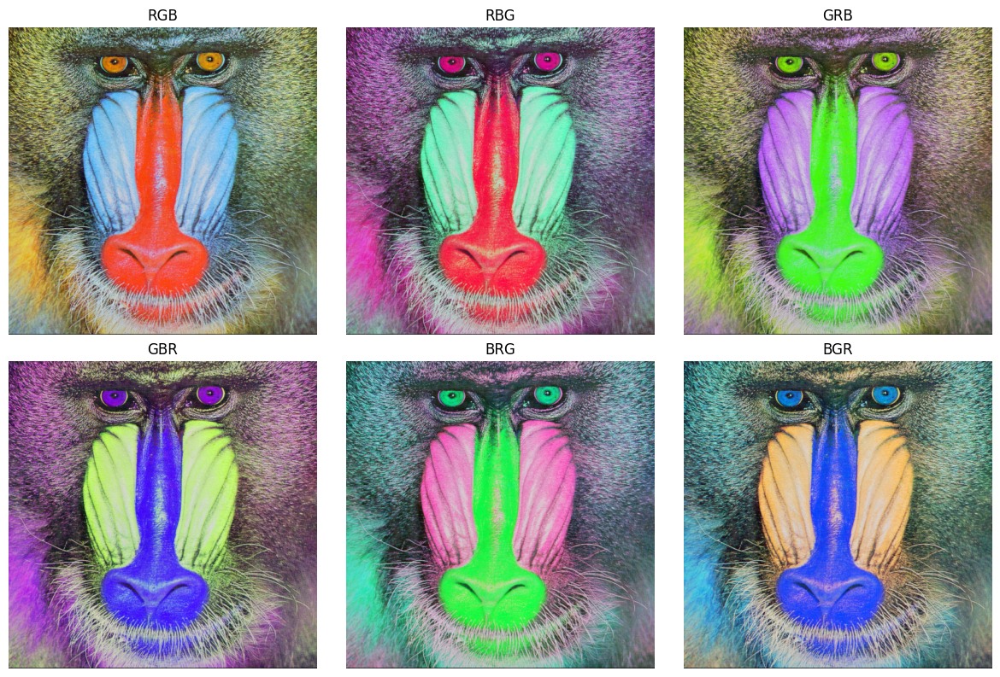

In [13]:
# Write the code to swap RGB channels and visualize different combinations

channels = {"R": R, "G": G, "B": B}
perms = ["RGB", "RBG", "GRB", "GBR", "BRG", "BGR"]

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.ravel()

for ax, p in zip(axes, perms):
    swapped = cv.merge([channels[p[0]], channels[p[1]], channels[p[2]]])
    ax.imshow(swapped)
    ax.set_title(p)
    ax.axis("off")

plt.tight_layout()
plt.show()


### Task 5: Save RGB Channels in Different Formats
- Save the Red channel as `.png`, Green as `.bmp`, and Blue as `.jpeg`.
- Use `cv.imwrite` to save images.


In [16]:
# OpenCV writes single-channel images fine. Use uint8.
cv.imwrite('./images/red_channel.png', R)
cv.imwrite('./images/green_channel.bmp', G)
cv.imwrite('./images/blue_channel.jpeg', B)
print("Saved R->png, G->bmp, B->jpeg")

Saved R->png, G->bmp, B->jpeg


### Task 6: Convert an image to grayscale.

- Use `cv.cvtColor` to convert the image to grayscale.
- Make sure your are using the right transformation (BGR2GRAY or RGB2GRAY) according to your image format.
- Visualize the grayscale image.



Alternatively, use the previously extracted R, G, and B channels to manually compute the grayscale image using the following formula:

1. Weighted Grayscale Conversion:

`Igray = 0.2989 * R + 0.5870 * G + 0.1140 * B`

2. Simple Average Method:

`Igray = Mean(R, G, B)`

After applying this transformation, ensure that you properly visualize and compare the grayscale output from both methods to confirm consistency.

### Question:

- These coefficients `(0.2989, 0.5870, 0.1140)` are not arbitrary—they come from a standard model used in image processing.

- How are these coefficients determined? What do they represent, and why are they used instead of a simple average?

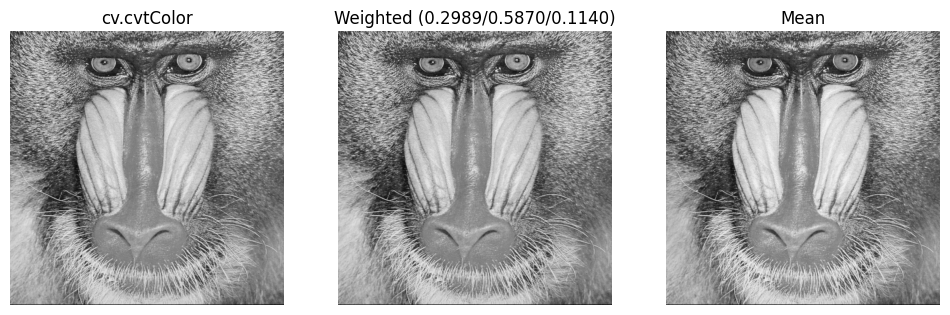

Mean abs diff (cv vs weighted): 0.5138626098632812


In [28]:
# Convert your color image to grayscale
gray_cv = cv.cvtColor(img_rgb, cv.COLOR_RGB2GRAY)

gray_weighted = (0.2989*R + 0.5870*G + 0.1140*B).astype(np.uint8)
gray_mean = ((R.astype(np.float32)+G.astype(np.float32)+B.astype(np.float32))/3.0).astype(np.uint8)

plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(gray_cv, cmap='gray'); plt.title("cv.cvtColor"); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(gray_weighted, cmap='gray'); plt.title("Weighted (0.2989/0.5870/0.1140)"); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(gray_mean, cmap='gray'); plt.title("Mean"); plt.axis('off')
plt.show()

print("Mean abs diff (cv vs weighted):", np.mean(np.abs(gray_cv.astype(int)-gray_weighted.astype(int))))

***Add your analysis and comments here***

The coefficients (0.2989, 0.5870, 0.1140) are based on human visual perception and give more importance to green, followed by red and blue. They are used instead of a simple average in order to produce a grayscale image that appears more natural to the human eye. This explains why the weighted grayscale image closely matches the result obtained using cv.cvtColor()

---

### Task 7: Negative Transformation
The negative transformation is a simple yet powerful operation applied to images. It inverts the pixel intensities of the image, enhancing white or gray details embedded in darker regions.

The formula for the negative transformation is:

    I_negative = 255 - I

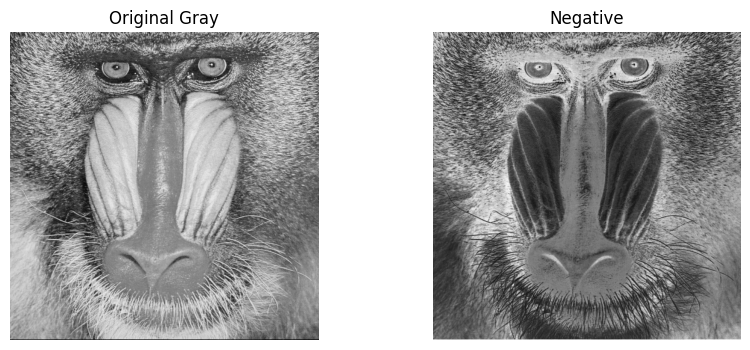

In [30]:
# Write the code to compute the negative transformation
neg = 255 - gray_cv

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.imshow(gray_cv, cmap='gray'); plt.title("Original Gray"); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(neg, cmap='gray'); plt.title("Negative"); plt.axis('off')
plt.show()

### Task 8: Contrast and Brightness Adjustment
1. **Define what contrast and brightness adjustment is.**
   - Provide a brief explanation of how contrast and brightness adjustment works.
   - Include its formula:
      
     

   I_new = alpha x I + beta


Where:
   - I_new: Adjusted pixel intensity
   - I: Original pixel intensity
   - alpha: Gain (controls contrast)
   - beta: Bias (adjusts brightness)
Increasing alpha enhances contrast, and adjusting beta shifts brightness.


2. **Explain the roles of alpha and beta:**
   - What does alpha (gain) control?
   - What does beta (bias) control?
   - How do changes to these parameters affect the appearance of an image?

*Write your answers below:*

### Note:
$\alpha$ & $\beta$ are used for linear transformation
$\gamma$ used for non-linear transformation

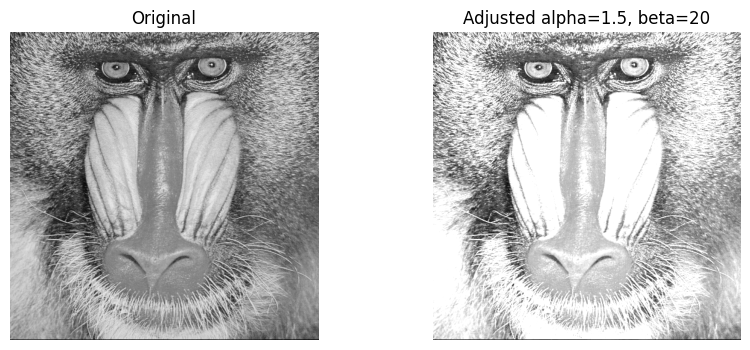

In [23]:
# Write the code here
alpha = 1.5  # contrast (gain)
beta = 20    # brightness (bias)

adj = cv.convertScaleAbs(gray_cv, alpha=alpha, beta=beta)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.imshow(gray_cv, cmap='gray'); plt.title("Original"); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(adj, cmap='gray'); plt.title(f"Adjusted alpha={alpha}, beta={beta}"); plt.axis('off')
plt.show()

***Add your analysis and comments here***

After applying the linear transformation with increased contrast (α = 1.5) and brightness (β = 20), the image appears significantly brighter.
High-intensity regions, particularly on the face and nose, become overexposed, leading to loss of fine texture.

At the same time, contrast between darker and brighter regions is enhanced, making facial contours more pronounced.

These results indicate that while brightness and contrast adjustment can improve visual impact, excessive parameter values may cause saturation and loss of detail in bright areas.

---

### Task 9: Gamma Transformation

Gamma correction applies a non-linear adjustment to pixel intensities.

#### Formula:
I_gamma = 255 * (I / 255) ^ gamma

#### Where:
- I_gamma: Gamma-corrected pixel intensity
- I: Original pixel intensity
- gamma: Gamma value
  - gamma > 1: Darkens the image and enhances darker regions.
  - gamma < 1: Brightens the image and enhances brighter regions.

---

Explain the Utility of Gamma Transformation
1. Why is gamma correction important in image processing?
2. In what situations is gamma correction useful?
3. How does gamma correction help in adjusting images for different display devices?
4. What happens to the histogram of an image when applying gamma correction with gamma > 1 vs. gamma < 1?

*Write your answers below:*

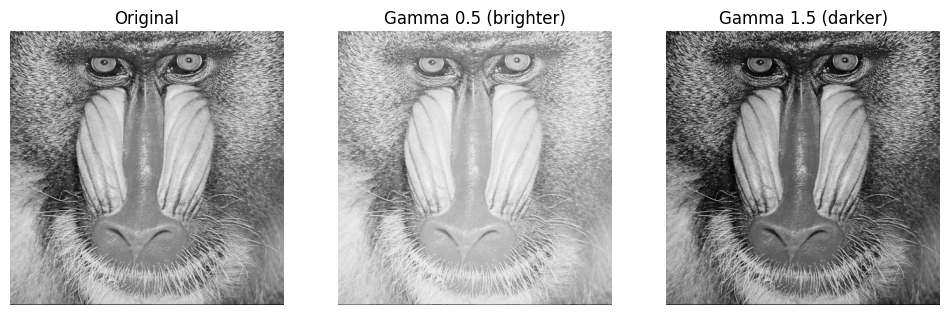

In [24]:
# Write the code here
def gamma_correct(img_u8, gamma):
    x = img_u8.astype(np.float32) / 255.0
    y = np.power(x, gamma)
    return np.uint8(255.0 * y)

g1 = gamma_correct(gray_cv, 0.5)
g2 = gamma_correct(gray_cv, 1.5)

plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(gray_cv, cmap='gray'); plt.title("Original"); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(g1, cmap='gray'); plt.title("Gamma 0.5 (brighter)"); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(g2, cmap='gray'); plt.title("Gamma 1.5 (darker)"); plt.axis('off')
plt.show()

***Add your analysis and comments here***

For γ = 0.5, the image appears noticeably brighter, with enhanced visibility of dark regions such as the fur and background.
Fine textures in shadowed areas become more distinguishable, although some bright regions appear less contrasted.

For γ = 1.5, the image becomes darker, and details in dark regions are reduced, particularly around the facial contours.
These results show that gamma correction redistributes intensity values non-linearly, allowing selective enhancement of either dark or bright regions depending on the chosen γ value.


---

### Task 10: Thresholding (Binarization)

Thresholding is a technique used to convert a grayscale image into a binary image.  
The process involves setting a threshold value \( T \), and each pixel is assigned either **0 (black)** or **255 (white)** based on the condition:

- If pixel intensity \( I(x, y) \) is greater than \( T \), set it to 255 (white).
- Otherwise, set it to 0 (black).

#### Formula:
I_bin(x, y) =
- 255, if I(x, y) > T
- 0, otherwise

This process simplifies the image and is useful in object detection and segmentation.


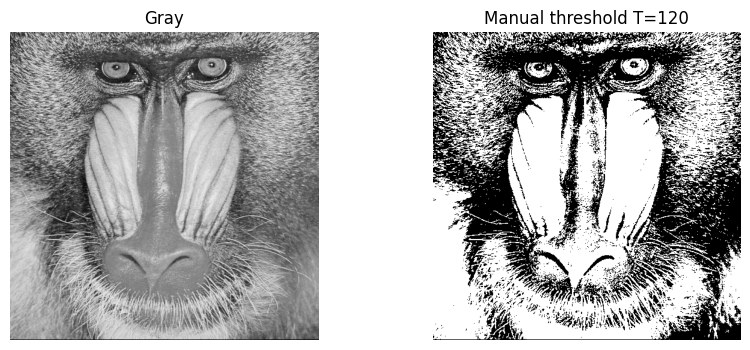

In [25]:
# Apply Manual Thresholding: (can be changed for experimentation)
T = 120  # try other values
binary_manual = np.where(gray_cv > T, 255, 0).astype(np.uint8)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.imshow(gray_cv, cmap='gray'); plt.title("Gray"); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(binary_manual, cmap='gray'); plt.title(f"Manual threshold T={T}"); plt.axis('off')
plt.show()

***Add your analysis and comments here***

Applying a manual threshold with T = 120 converts the grayscale image into a binary representation.

Bright regions of the face, such as the nose and cheeks, are successfully highlighted, while darker regions like the eyes and fur are suppressed.

However, fine texture details are lost, and some areas appear noisy due to intensity variations within textured regions.

This result shows that manual thresholding can provide basic foreground–background separation, but its performance is highly dependent on the chosen threshold value.


---

### Task 11: Otsu's Thresholding

Otsu’s method is an advanced form of thresholding that automatically determines the **optimal threshold value \( T \)**.  
Instead of manually setting \( T \), Otsu’s algorithm finds a value that minimizes the variance between foreground and background pixel intensities.

#### Key Advantages:
- **Automatic threshold selection** (no need to choose \( T \) manually).
- **Works well on images with a bimodal histogram** (two distinct peaks in intensity distribution).
- **Reduces sensitivity to lighting variations.**


Compare the results of both methods **manual thresholding** and **Otsu's Thresholding**

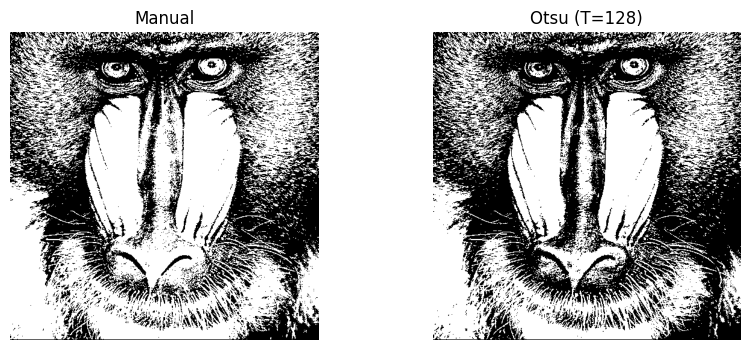

In [26]:
# Otsu expects a grayscale uint8 image
T_otsu, binary_otsu = cv.threshold(gray_cv, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.imshow(binary_manual, cmap='gray'); plt.title("Manual"); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(binary_otsu, cmap='gray'); plt.title(f"Otsu (T={T_otsu:.0f})"); plt.axis('off')
plt.show()

***Add your analysis and comments here***

Compared to manual thresholding, Otsu’s method produces a more balanced and consistent binary image.

Facial structures appear more continuous, and noise in textured regions such as the fur is slightly reduced.

The automatically selected threshold (T = 128) provides improved separation between bright facial areas and darker background regions.

This result demonstrates that Otsu thresholding adapts to the image intensity distribution, reducing sensitivity to subjective threshold selection.


--- 


### Now, repeat Tasks 8 to 11 using different images of your choice and analyze the results.

---

# Manipulation 3: Quantize a Grayscale Image
### Understanding Quantization and Histograms
1- Quantization is the process of reducing the number of intensity levels in an image. In grayscale images, pixel values range from 0 to 255, representing 256 possible shades. By reducing these levels (e.g., to 128, 64, 32, etc.), we limit the number of shades, simplifying the image but potentially reducing its quality.

2- A histogram represents the distribution of pixel intensities in an image. It shows how frequently each intensity value appears. When we quantize an image, we effectively "group" similar intensity values, leading to a histogram with fewer distinct peaks. Observing these histograms helps us understand how information is lost and how the image’s appearance is affected.

---

Instructions
In this section, you will:

1- Quantize the grayscale image into different levels (128, 64, 32, 16, 8, 4, 2).
2- Visualize the quantized images and their histograms.
3- Observe the effects of reduced levels on image quality.

To quantize the grayscale image, apply the following formula:

`quantized_image = (Img_gray // (256 / levels)) * (256 / levels)`


### Task 1: Image Quantization
The goal is to observe how reducing the number of intensity levels affects image quality.

Steps:
Convert the image to grayscale using cv.cvtColor.

Define different quantization levels to reduce the number of shades in the image (e.g., quant_levels = {128, 64, 32, 16, 8, 4, 2}).

Apply quantization using the formula above.

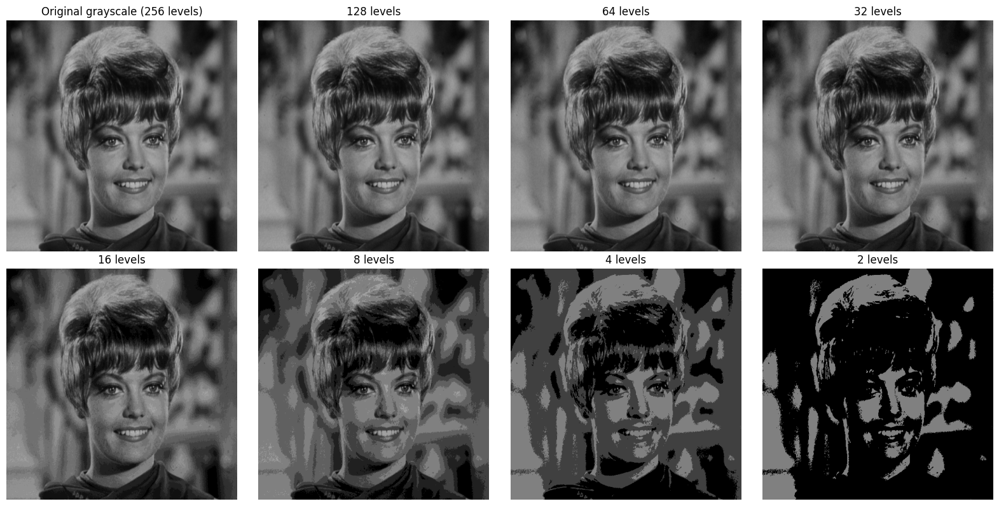

In [31]:
# Use the following image for this section
img_bgr = cv.imread("./images/zelda.png")

img_gray = cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY)

# Quantization levels (number of gray levels to keep)
quant_levels = [128, 64, 32, 16, 8, 4, 2]

quantized_images = {}
for L in quant_levels:
    # Map 0..255 into L bins: bin_size = 256/L
    bin_size = 256 // L
    q = (img_gray // bin_size) * bin_size
    quantized_images[L] = q.astype(np.uint8)

# Visualize
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.ravel()

axes[0].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original grayscale (256 levels)")
axes[0].axis("off")

for i, L in enumerate(quant_levels, start=1):
    axes[i].imshow(quantized_images[L], cmap="gray", vmin=0, vmax=255)
    axes[i].set_title(f"{L} levels")
    axes[i].axis("off")

# Hide any remaining axes
for j in range(len(quant_levels)+1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


***Add your analysis and comments here***

| Number of Gray Levels | Visual Appearance | Observations |
|----------------------|------------------|--------------|
| **256 (Original)** | Natural grayscale image | Smooth intensity transitions with full detail. Fine textures in the face, hair, and background are clearly visible. |
| **128** | Very close to original | Minor loss of subtle shading, but no noticeable visual degradation. The image remains natural. |
| **64** | Slight degradation | Small reduction in smoothness in uniform regions, but facial features and details are still well preserved. |
| **32** | Beginning of artifacts | Slight banding appears in smooth regions such as the cheeks and background. Overall structure remains clear. |
| **16** | Visible quantization | Intensity steps become noticeable. Fine texture starts to disappear, especially in softly shaded areas. |
| **8** | Strong posterization | Large uniform regions replace smooth gradients. Image realism decreases, although main features remain recognizable. |
| **4** | Severe information loss | Very limited intensity levels. Most texture and shading are lost, leaving only coarse shapes. |
| **2** | Near-binary image | The image is reduced to two intensity values. Only major structures remain, and most visual detail is lost. |

These results demonstrate that gray-level quantization primarily affects smooth intensity variations, while major edges and structures remain visible even at low gray-level counts.



---

### Task 2: Histogram Analysis
- Compute and display histograms for each quantized image.
- Use `cv.calcHist` to compute the histogram.

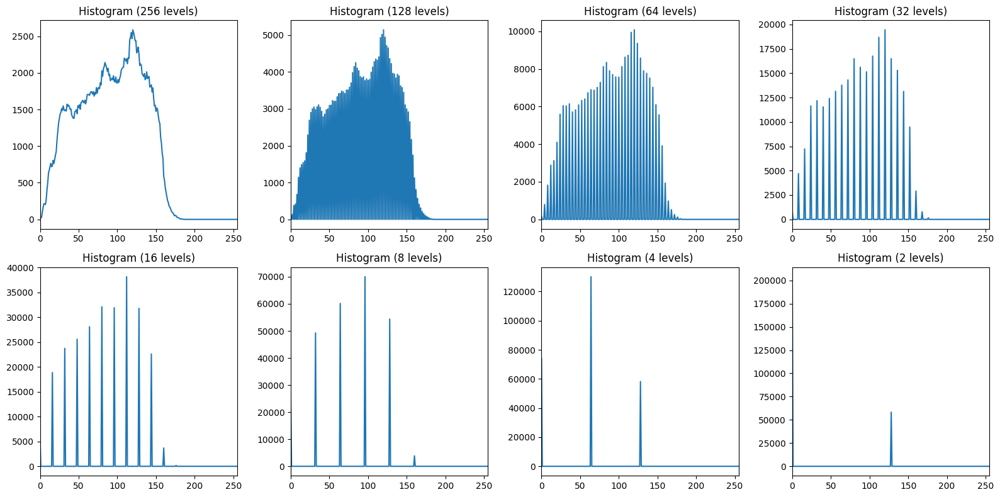

In [34]:
def plot_hist(img, title, ax):
    hist = cv.calcHist([img], [0], None, [256], [0, 256])
    ax.plot(hist)
    ax.set_title(title)
    ax.set_xlim([0, 255])

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.ravel()

plot_hist(img_gray, "Histogram (256 levels)", axes[0])

for i, L in enumerate(quant_levels, start=1):
    plot_hist(quantized_images[L], f"Histogram ({L} levels)", axes[i])

for j in range(len(quant_levels)+1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


***Add your analysis and comments here***

The histogram of the original grayscale image (256 levels) shows a smooth and continuous distribution of intensities, indicating high gray-level precision and good contrast.
As the number of gray levels decreases, the histogram becomes progressively more discrete, with fewer distinct intensity values and increasing gaps between them.
For 32 and 16 gray levels, the histogram consists of separated peaks, reflecting the grouping of many pixels into the same intensity levels due to quantization.
At very low gray levels (8, 4, and 2), the histogram collapses into a small number of dominant spikes, indicating severe loss of intensity resolution.
These results confirm that gray-level quantization reduces intensity precision while preserving the global structure of the intensity distribution.


---
# Manipulation 4: Histogram Equalization
- Histogram equalization is a technique used to enhance the contrast of an image by redistributing pixel intensity values more evenly. It works by spreading out the most frequent intensity values, making details in darker and lighter regions more distinguishable.

- This method is particularly useful in images with low contrast, where pixel intensities are clustered within a narrow range. By equalizing the histogram, we aim to improve visibility and highlight important details.


### Task 1: Load and Analyze the Image

1. Load the image: Read the `flower.bmp` image using OpenCV.
2. Display the original color image.
4. Convert the image to grayscale.


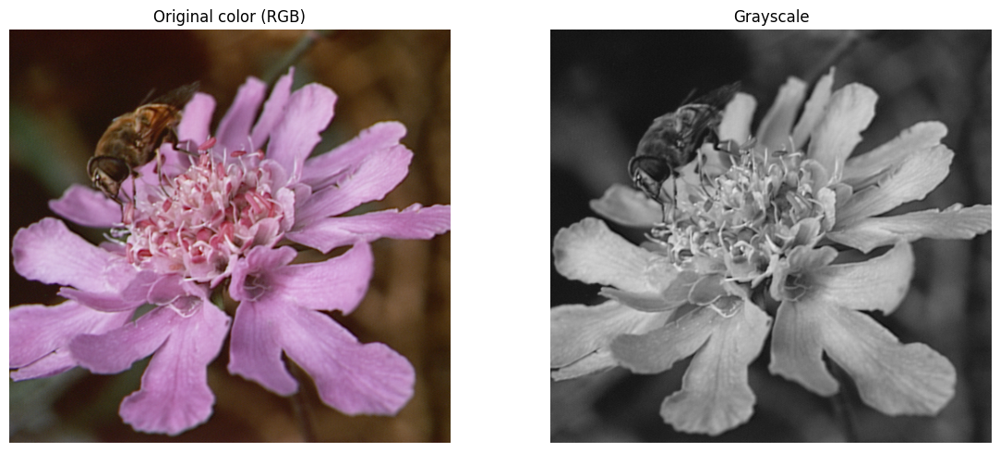

In [35]:
# Use the following image for this section
img_color = cv.imread("./images/flower.bmp")
if img_color is None:
    raise FileNotFoundError(
        "Could not find ./images/flower.bmp. Make sure the 'images' folder exists."
    )

img_color_rgb = cv.cvtColor(img_color, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img_color, cv.COLOR_BGR2GRAY)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_color_rgb)
axes[0].set_title("Original color (RGB)")
axes[0].axis("off")

axes[1].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Grayscale")
axes[1].axis("off")

plt.tight_layout()
plt.show()


### Task 2: Compute and Display Histogram and Normalized Histogram

1. Calculate the histogram of the grayscale image using cv.calcHist(). This function provides the frequency of each intensity value (0–255).
2. Normalize the histogram by dividing each bin count by the total number of pixels in the image. This normalization converts the histogram into a probability distribution, which is useful for understanding the relative frequency of intensity values.
3. Visualize the original histogram and the normalized histogram side by side using Matplotlib. This will help in understanding how the intensity values are distributed and whether contrast enhancement is needed.

After visualizing the histograms, analyze:

1. Is the histogram spread across the full intensity range (0–255), or is it concentrated in a narrow range?
2. Does the image seem to have high or low contrast?

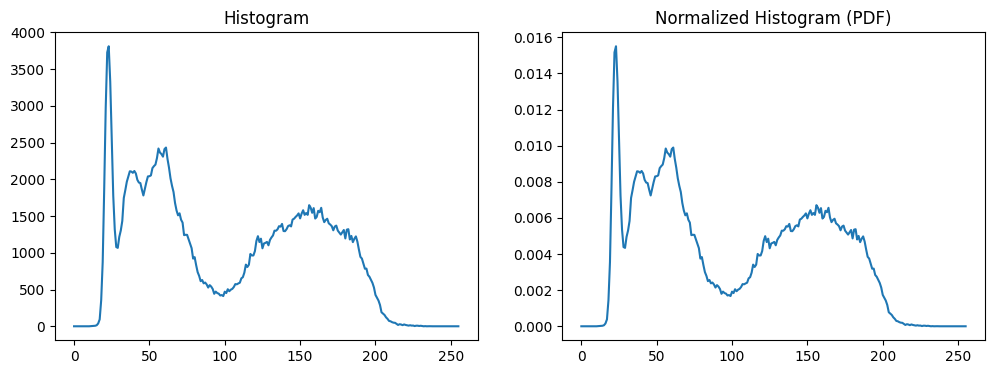

In [37]:
# Put your code here
img_rgb2 = cv.cvtColor(img_color, cv.COLOR_BGR2RGB)
gray2 = cv.cvtColor(img_color, cv.COLOR_BGR2GRAY)

hist = cv.calcHist([gray2],[0],None,[256],[0,256]).ravel()
hist_norm = hist / hist.sum()
cdf = np.cumsum(hist_norm)

plt.figure(figsize=(12,4))
plt.subplot(1,2,1); plt.plot(hist); plt.title("Histogram")
plt.subplot(1,2,2); plt.plot(hist_norm); plt.title("Normalized Histogram (PDF)")
plt.show()

***Add your analysis and comments here***

The grayscale histogram shows a non-uniform distribution of intensities, with a strong concentration of pixels in low and mid-gray ranges.
This indicates limited contrast, as many pixels share similar intensity values.
The normalized histogram (PDF) preserves the same distribution shape while expressing pixel frequencies as probabilities.
This representation is essential for computing the cumulative distribution function used in histogram equalization.


---


### Task 3: Compute and Display Cumulative Histogram

- Calculate the cumulative histogram of the grayscale image using `cumsum()` on the computed histogram.
- Plot the cumulative histogram using Matplotlib.


***What is a Cumulative Histogram?***
A cumulative histogram represents the cumulative sum of pixel intensities in an image. Unlike a regular histogram that shows the frequency of each intensity value, a cumulative histogram provides insight into how intensities accumulate across the range.

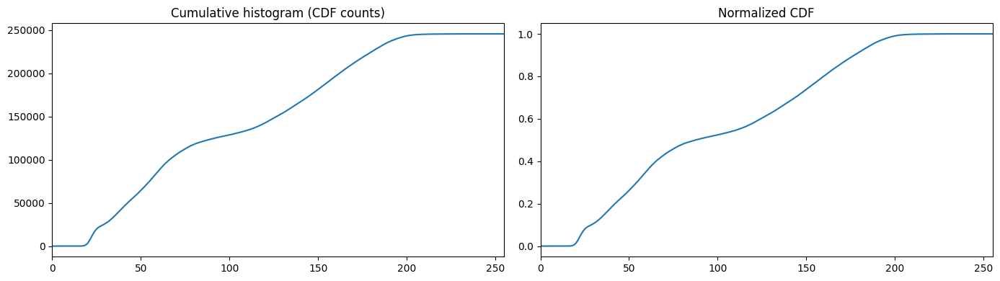

In [39]:
# Put your code here

cdf = hist.cumsum()
cdf_norm = cdf / cdf[-1]  # normalize to [0,1]

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].plot(cdf)
axes[0].set_title("Cumulative histogram (CDF counts)")
axes[0].set_xlim([0, 255])

axes[1].plot(cdf_norm)
axes[1].set_title("Normalized CDF")
axes[1].set_xlim([0, 255])

plt.tight_layout()
plt.show()


The cumulative histogram shows a non-linear increase, with a steep rise in low-to-mid gray levels, indicating that a large proportion of pixels fall within this intensity range.
The normalized CDF preserves this shape while mapping values to the range [0, 1], making it suitable for intensity remapping.
Steep regions of the CDF correspond to intensity ranges with high pixel concentration, while flatter regions represent less frequent intensities.
This CDF serves as the transformation function in histogram equalization, redistributing intensities to improve global contrast.


### Task 4: Histogram Equalization Using OpenCV


1. Apply OpenCV’s histogram equalization on the grayscale image using `cv.equalizeHist()`.
2. Compute and visualize the histogram of the equalized image.
3. Compare the histograms of the original grayscale image and the equalized image to observe how pixel intensities are redistributed.
4. Display the original and equalized grayscale images side by side to visually assess the contrast improvement.
5. Comment the results about how weel the image it becomes.

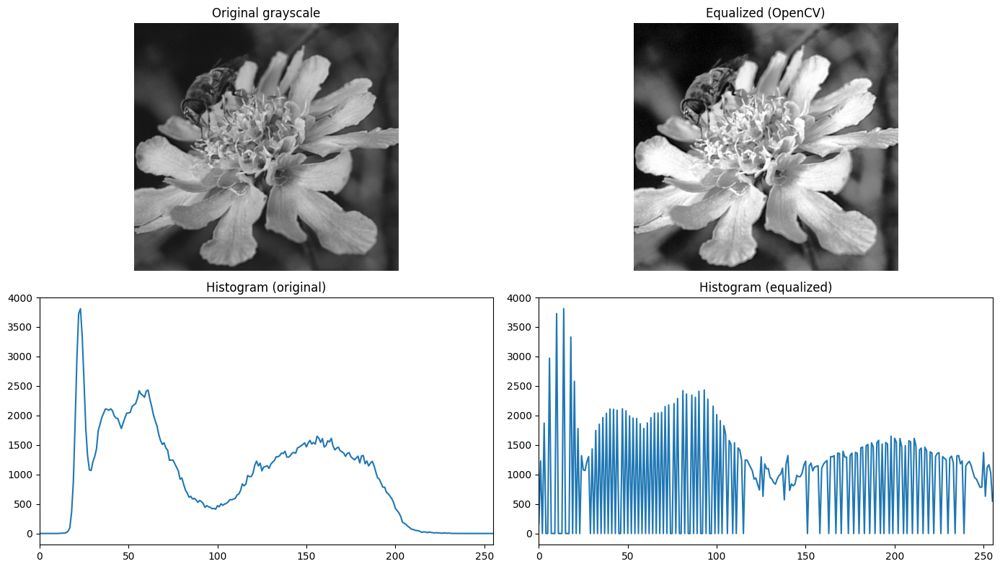

In [43]:
# Task 4 — Histogram equalization (OpenCV)

eq_cv = cv.equalizeHist(img_gray)

# Histograms
hist_orig = cv.calcHist([img_gray], [0], None, [256], [0, 256]).ravel()
hist_eq = cv.calcHist([eq_cv], [0], None, [256], [0, 256]).ravel()

fig, axes = plt.subplots(2, 2, figsize=(14, 8))

axes[0,0].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
axes[0,0].set_title("Original grayscale")
axes[0,0].axis("off")

axes[0,1].imshow(eq_cv, cmap="gray", vmin=0, vmax=255)
axes[0,1].set_title("Equalized (OpenCV)")
axes[0,1].axis("off")

axes[1,0].plot(hist_orig)
axes[1,0].set_title("Histogram (original)")
axes[1,0].set_xlim([0, 255])

axes[1,1].plot(hist_eq)
axes[1,1].set_title("Histogram (equalized)")
axes[1,1].set_xlim([0, 255])

plt.tight_layout()
plt.show()


***Add your analysis and comments here***

| Aspect | Original Grayscale Image | Equalized Image (OpenCV) |
|------|--------------------------|--------------------------|
| Visual contrast | Moderate and uneven contrast | Improved global contrast |
| Detail visibility | Some fine details are visible but not strongly emphasized | Fine details in petals and flower center are more distinguishable |
| Dark regions | Dark background regions appear compressed | Dark regions gain visibility and separation |
| Bright regions | Bright areas are clustered in narrow intensity ranges | Bright intensities are redistributed across a wider range |
| Noise appearance | Relatively smooth appearance | Slight noise amplification in some regions |
| Histogram shape | Strong peaks in specific intensity ranges | More uniformly distributed histogram |
| Gray-level usage | Limited use of available gray levels | Better utilization of the full gray-level range |

Histogram equalization improves global contrast by redistributing pixel intensities across the available gray-level range.
This leads to enhanced visibility of image details, as confirmed by both the visual result and the more uniform histogram.
However, the method may also amplify noise, highlighting a limitation of global histogram equalization.

---


### Task 5: Manual Histogram Equalization and Comparison with OpenCV

In this task, you will implement histogram equalization manually and compare the results with OpenCV’s cv.equalizeHist() function. This will help in understanding how histogram equalization works at a pixel level.


1. Compute the histogram of the grayscale image.
2. Calculate the cumulative distribution function (CDF) from the histogram.
3. Normalize the CDF to scale pixel values between 0 and 255.
4. Use the CDF as a mapping function to adjust pixel intensities in the grayscale image.
5. Compare the manually equalized image with OpenCV’s equalizeHist() output.
6. Compute and visualize histograms of both equalized images.
7. Analyze the results, noting differences in contrast and intensity distribution.

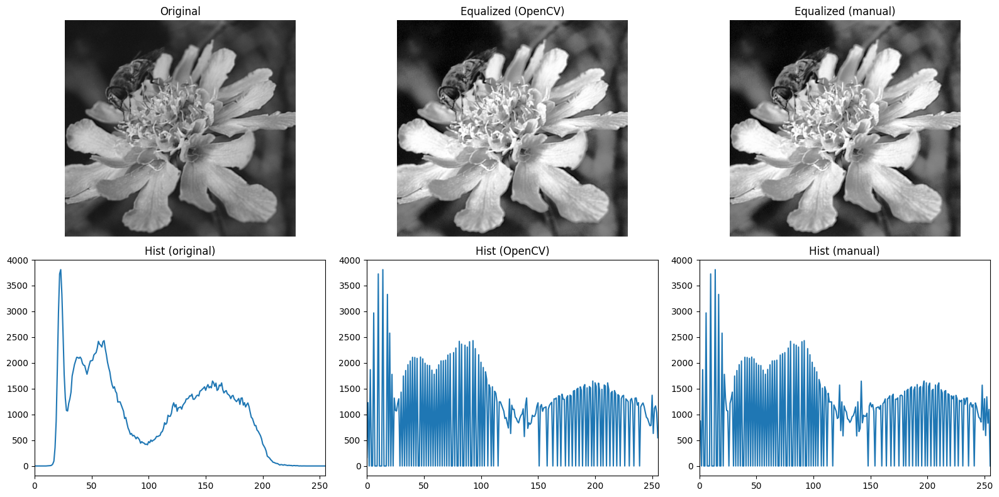

Mean abs diff (manual vs OpenCV): 0.5286214192708333


In [44]:
# Task 5 — Manual histogram equalization + comparison with OpenCV

# 1) Histogram
hist = cv.calcHist([img_gray], [0], None, [256], [0, 256]).ravel()

# 2) CDF
cdf = hist.cumsum()

# 3) Normalize CDF to [0,255] (avoid division by zero)
cdf_min = cdf[cdf > 0].min()
cdf_scaled = (cdf - cdf_min) / (cdf[-1] - cdf_min)  # -> [0,1]
lut = np.clip(cdf_scaled * 255, 0, 255).astype(np.uint8)  # Look-Up Table

# 4) Map pixels using LUT
eq_manual = lut[img_gray]

# 5) Compare with OpenCV equalization
eq_cv = cv.equalizeHist(img_gray)

# Histograms
hist_manual = cv.calcHist([eq_manual], [0], None, [256], [0, 256]).ravel()
hist_cv = cv.calcHist([eq_cv], [0], None, [256], [0, 256]).ravel()

fig, axes = plt.subplots(2, 3, figsize=(16, 8))

axes[0,0].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
axes[0,0].set_title("Original")
axes[0,0].axis("off")

axes[0,1].imshow(eq_cv, cmap="gray", vmin=0, vmax=255)
axes[0,1].set_title("Equalized (OpenCV)")
axes[0,1].axis("off")

axes[0,2].imshow(eq_manual, cmap="gray", vmin=0, vmax=255)
axes[0,2].set_title("Equalized (manual)")
axes[0,2].axis("off")

axes[1,0].plot(cv.calcHist([img_gray],[0],None,[256],[0,256]).ravel())
axes[1,0].set_title("Hist (original)")
axes[1,0].set_xlim([0,255])

axes[1,1].plot(hist_cv)
axes[1,1].set_title("Hist (OpenCV)")
axes[1,1].set_xlim([0,255])

axes[1,2].plot(hist_manual)
axes[1,2].set_title("Hist (manual)")
axes[1,2].set_xlim([0,255])

plt.tight_layout()
plt.show()

print("Mean abs diff (manual vs OpenCV):", np.mean(np.abs(eq_manual.astype(np.int16) - eq_cv.astype(np.int16))))


***Add your analysis and comments here***

Both the OpenCV and manually implemented histogram equalization methods produce a clear improvement in global contrast compared to the original grayscale image.
In both equalized images, details in the flower petals and central structure become more visible, and darker background regions are better separated from the foreground.
The visual appearance of the manually equalized image is very similar to the OpenCV result, indicating that both approaches apply the same histogram and CDF-based intensity remapping.
The corresponding histograms confirm this observation, as both equalized histograms show a more uniform distribution of gray levels compared to the original.
Minor differences between the two results can be attributed to discretization and rounding effects during the manual computation.


---


### Task 6: Equalize Color Image Channels Independently

- Objective: Apply histogram equalization independently to each color channel (B, G, R) and calculate the entropy of the equalized channels.
- Steps:
    1. Split the color image into its Blue (B), Green (G), and Red (R) channels.
    2. Equalize each channel independently using cv.equalizeHist.
    3. Merge the equalized channels back into a single color image.
    4. Define a function to calculate entropy for a single channel.
    5. Compute the entropy of each equalized channel to analyze the uniformity of pixel intensities.
    6. Visualize the original color image and the independently equalized color image side by side.
- Comments:
    - Independent equalization of channels can enhance contrast but might cause slight color distortions.
    - Higher entropy values indicate a more uniform intensity distribution.

Independent equalization entropies:
  B: 7.110785484313965
  G: 7.319527626037598
  R: 7.316534519195557


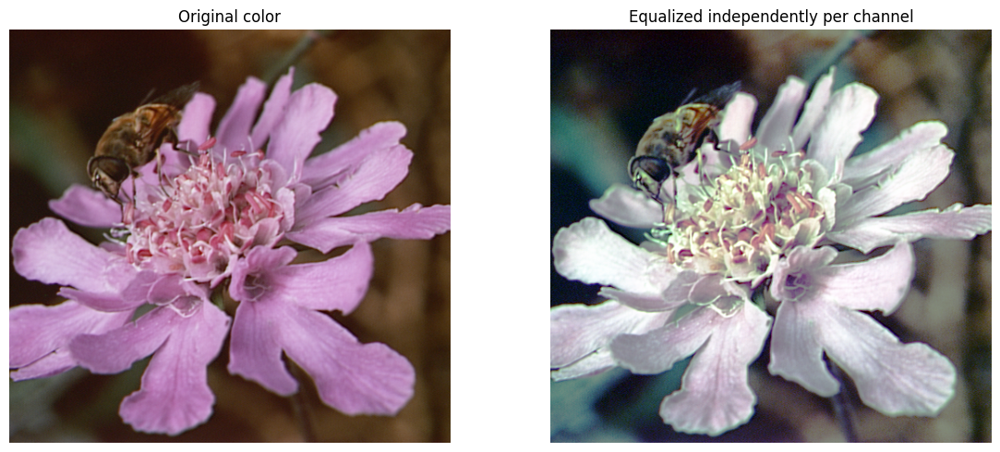

In [45]:
# Put your code here

def entropy_u8(channel_u8: np.ndarray) -> float:
    # Compute probability distribution
    hist = cv.calcHist([channel_u8], [0], None, [256], [0, 256]).ravel()
    p = hist / hist.sum()
    p = p[p > 0]
    return float(-(p * np.log2(p)).sum())

# Split BGR channels from original color image (OpenCV's default)
B, G, R = cv.split(img_color)

B_eq = cv.equalizeHist(B)
G_eq = cv.equalizeHist(G)
R_eq = cv.equalizeHist(R)

img_eq_independent_bgr = cv.merge([B_eq, G_eq, R_eq])
img_eq_independent_rgb = cv.cvtColor(img_eq_independent_bgr, cv.COLOR_BGR2RGB)

ent_B_ind = entropy_u8(B_eq)
ent_G_ind = entropy_u8(G_eq)
ent_R_ind = entropy_u8(R_eq)

print("Independent equalization entropies:")
print("  B:", ent_B_ind)
print("  G:", ent_G_ind)
print("  R:", ent_R_ind)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_color_rgb)
axes[0].set_title("Original color")
axes[0].axis("off")

axes[1].imshow(img_eq_independent_rgb)
axes[1].set_title("Equalized independently per channel")
axes[1].axis("off")
plt.tight_layout()
plt.show()


***Add your analysis and comments here***

Independent histogram equalization of the RGB channels leads to a strong increase in contrast, as reflected by the high entropy values obtained for all channels (B: 7.11, G: 7.32, R: 7.32).
Visually, the image appears highly contrasted; however, significant color distortion is introduced, and the original color balance of the flower is not preserved.
This occurs because each channel is equalized independently, altering the relative relationships between RGB components.
Although entropy is increased, the resulting image appears less natural, demonstrating that higher information content does not necessarily correspond to better perceptual quality in color images.

---



### Task 7: Equalize Color Channels Using Cumulative Histogram

- Objective: Perform histogram equalization on each color channel (B, G, R) using the cumulative histogram from the grayscale image and calculate the entropy for the resulting image.
- Steps:
    1. Normalize the cumulative histogram from the grayscale image to scale it to the range [0, 255].
    2. Apply the normalized cumulative histogram to each color channel (B, G, R).
    3. Merge the equalized channels back into a single color image.
    4. Calculate the entropy of the equalized channels to analyze the uniformity of pixel intensities.
    5. Display the original and cumulatively equalized color images for comparison.

Cumulative (grayscale-based) mapping entropies:
  B: 6.1199493408203125
  G: 7.108420372009277
  R: 6.842203140258789


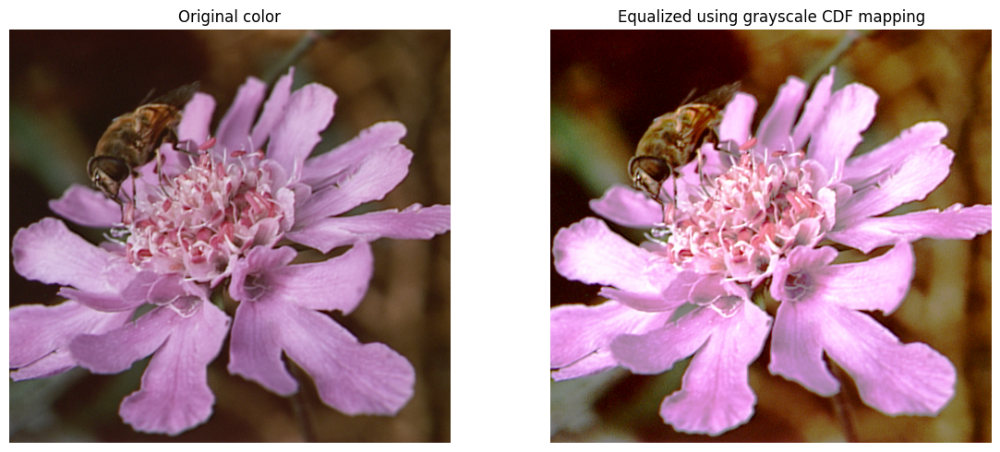

In [46]:
# Put your code here

# Compute grayscale histogram and CDF from the grayscale image (img_gray from Task 1)
hist_gray = cv.calcHist([img_gray], [0], None, [256], [0, 256]).ravel()
cdf_gray = hist_gray.cumsum()

# Normalize CDF to [0,255] to build a LUT
cdf_min = cdf_gray[cdf_gray > 0].min()
cdf_scaled = (cdf_gray - cdf_min) / (cdf_gray[-1] - cdf_min)
lut_gray = np.clip(cdf_scaled * 255, 0, 255).astype(np.uint8)

# Apply the SAME LUT to each channel
B_cum = lut_gray[B]
G_cum = lut_gray[G]
R_cum = lut_gray[R]

img_eq_cumulative_bgr = cv.merge([B_cum, G_cum, R_cum])
img_eq_cumulative_rgb = cv.cvtColor(img_eq_cumulative_bgr, cv.COLOR_BGR2RGB)

ent_B_cum = entropy_u8(B_cum)
ent_G_cum = entropy_u8(G_cum)
ent_R_cum = entropy_u8(R_cum)

print("Cumulative (grayscale-based) mapping entropies:")
print("  B:", ent_B_cum)
print("  G:", ent_G_cum)
print("  R:", ent_R_cum)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_color_rgb)
axes[0].set_title("Original color")
axes[0].axis("off")

axes[1].imshow(img_eq_cumulative_rgb)
axes[1].set_title("Equalized using grayscale CDF mapping")
axes[1].axis("off")
plt.tight_layout()
plt.show()


***Add your analysis and comments here***

Applying histogram equalization using a grayscale-based CDF mapping improves the global contrast of the color image while preserving its natural color appearance.
Compared to independent RGB equalization, this approach enhances details in the flower petals and central structure without introducing noticeable color distortion.
The entropy values obtained for the B, G, and R channels (6.12, 7.11, and 6.84 respectively) indicate a high level of intensity variability, with the green channel exhibiting the highest information content.
These results confirm that grayscale-based CDF mapping provides effective contrast enhancement while maintaining color consistency across channels.

---


### Task 8: Compare Independent and Cumulative Equalization

1. Print the entropies for each channel (B, G, R) after independent and cumulative equalization.
2. Analyze the differences in entropy values between the two methods.

- Comments:
    - Entropies are generally higher for cumulative equalization, reflecting a more uniform intensity distribution across all channels.
    - Independent equalization can cause color distortions due to varying transformations applied to each channel.
    - Cumulative equalization uses a consistent transformation, ensuring better color preservation.

In [47]:
# Put your code here

print("Entropy comparison (higher = more uniform distribution):")
print("Channel   Independent   Cumulative(CDF)")
print(f"B         {ent_B_ind:10.4f}   {ent_B_cum:14.4f}")
print(f"G         {ent_G_ind:10.4f}   {ent_G_cum:14.4f}")
print(f"R         {ent_R_ind:10.4f}   {ent_R_cum:14.4f}")


Entropy comparison (higher = more uniform distribution):
Channel   Independent   Cumulative(CDF)
B             7.1108           6.1199
G             7.3195           7.1084
R             7.3165           6.8422


***Add your analysis and comments here***

Independent RGB histogram equalization produces higher entropy values across all channels, indicating a more uniform intensity distribution and stronger contrast enhancement.
However, visual inspection shows that this approach introduces significant color distortion, as the relative relationships between RGB channels are not preserved.
In contrast, grayscale-based CDF mapping results in slightly lower entropy values but maintains the original color balance of the image while still improving contrast.
This comparison demonstrates that maximizing entropy independently in RGB channels does not necessarily lead to better perceptual quality.
Grayscale-based mapping provides a better trade-off between contrast enhancement and color fidelity, making it more suitable for color image processing.

---


# Manipulation 5: Image Similarity Analysis
In this optional section, you will explore how images can be compared based on their statistical properties. The goal is to understand how image similarity can be assessed without directly comparing individual pixels but rather by analyzing overall intensity distributions.

---

- One possible solution is to analyze the histogram of the images.


<>:25: SyntaxWarning: invalid escape sequence '\d'
<>:26: SyntaxWarning: invalid escape sequence '\d'
<>:25: SyntaxWarning: invalid escape sequence '\d'
<>:26: SyntaxWarning: invalid escape sequence '\d'
D:\Temp\ipykernel_6004\1413072440.py:25: SyntaxWarning: invalid escape sequence '\d'
  img1 = load_gray("./images for Manipulation 5\desert1.png")
D:\Temp\ipykernel_6004\1413072440.py:26: SyntaxWarning: invalid escape sequence '\d'
  img2 = load_gray("./images for Manipulation 5\desert2.png")


Histogram similarity metrics:
 - Correlation (higher = more similar): -0.0127
 - Bhattacharyya distance (lower = more similar): 0.4560


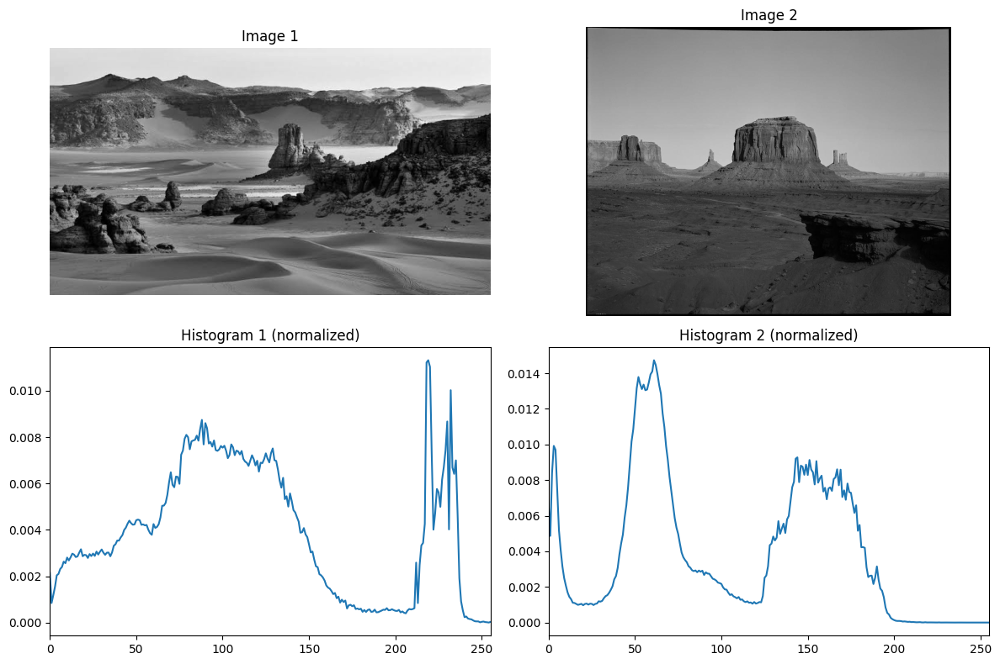

In [8]:
# Put your code here

# We'll compare two grayscale images by histogram distance.
# (You can replace these with any images you want.)

def load_gray(path: str):
    im = cv.imread(path, cv.IMREAD_GRAYSCALE)
    if im is None:
        raise FileNotFoundError(f"Missing file: {path}")
    return im

def hist_u8(im_gray: np.ndarray):
    h = cv.calcHist([im_gray], [0], None, [256], [0, 256]).ravel()
    h = h / (h.sum() + 1e-12)  # normalize
    return h

def compare_hists(h1, h2):
    # OpenCV provides several metrics: CORREL, CHISQR, INTERSECT, BHATTACHARYYA
    # Here we compute 2 common ones.
    corr = cv.compareHist(h1.astype(np.float32), h2.astype(np.float32), cv.HISTCMP_CORREL)
    bhatt = cv.compareHist(h1.astype(np.float32), h2.astype(np.float32), cv.HISTCMP_BHATTACHARYYA)
    return corr, bhatt

# Example: compare mandrill vs zelda (both should exist in ./images)
img1 = load_gray("./images for Manipulation 5\desert1.png")
img2 = load_gray("./images for Manipulation 5\desert2.png")

h1 = hist_u8(img1)
h2 = hist_u8(img2)

corr, bhatt = compare_hists(h1, h2)

print("Histogram similarity metrics:")
print(f" - Correlation (higher = more similar): {corr:.4f}")
print(f" - Bhattacharyya distance (lower = more similar): {bhatt:.4f}")

# Visualize images + histograms
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

axes[0,0].imshow(img1, cmap="gray", vmin=0, vmax=255)
axes[0,0].set_title("Image 1")
axes[0,0].axis("off")

axes[0,1].imshow(img2, cmap="gray", vmin=0, vmax=255)
axes[0,1].set_title("Image 2")
axes[0,1].axis("off")

axes[1,0].plot(h1)
axes[1,0].set_title("Histogram 1 (normalized)")
axes[1,0].set_xlim([0, 255])

axes[1,1].plot(h2)
axes[1,1].set_title("Histogram 2 (normalized)")
axes[1,1].set_xlim([0, 255])

plt.tight_layout()
plt.show()


Although both images represent desert landscapes, their normalized grayscale histograms differ significantly.
This is reflected by the low correlation value (-0.0127), indicating almost no linear similarity between the histogram shapes.
The Bhattacharyya distance (0.4560) further confirms a noticeable difference in the intensity distributions.
These differences are mainly due to variations in illumination, shadows, and the proportion of bright sand versus dark rock regions.
This result demonstrates that histogram-based similarity captures global brightness characteristics rather than semantic similarity, and images from the same scene category may still produce dissimilar histograms.


**Note:**
Histogram similarity metrics depend on the intensity distribution of the selected images.
Therefore, different image pairs produce different similarity values, which is expected.
In this manipulation, a representative pair of images is analyzed to illustrate the concept.



### Report

This lab explored fundamental image processing concepts used in Computer Vision through practical experiments on real and synthetic images.

From the early manipulations, images were understood as **numerical matrices**, where pixel intensities and spatial arrangement define visual structures. **Intensity transformations** such as **negative**, **brightness/contrast** adjustment, and **gamma correction** showed how image appearance can be modified globally or non-linearly to enhance visibility.

**Thresholding experiments** demonstrated the importance of selecting appropriate decision rules for segmentation, with **Otsu’s method** providing more robust results than manual thresholding. **Gray-level quantization** highlighted the trade-off between visual quality and data precision, showing that edges and structures remain recognizable even when intensity resolution is reduced.

**Histogram analysis** and **equalization** revealed how contrast is directly linked to intensity distribution. **Histogram equalization** improved global contrast by redistributing pixel intensities, while comparisons between manual and OpenCV implementations confirmed their conceptual equivalence. In **color images**, **independent RGB equalization** increased entropy but caused **color distortion**, whereas **grayscale-based mapping** preserved **color consistency while enhancing contrast**.

Finally, **histogram similarity metrics** showed that images with different content may still share **similar intensity distributions**, emphasizing that histogram-based comparison captures **global appearance** but not **spatial structure**.

Overall, this lab demonstrated how low-level image processing techniques form the foundation for more advanced Computer Vision methods.
